<a href="https://colab.research.google.com/github/AlessandroMessori/ANN_Challenge_1/blob/main/Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
%cd /gdrive/MyDrive/ANN&DL/Challenge

/gdrive/MyDrive/ANN&DL/Challenge


In [ ]:
# Import libraries
import tensorflow as tf
import numpy as np
import os
import random
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix
from PIL import Image

tfk = tf.keras
tfkl = tf.keras.layers
print(tf.__version__)

2.7.0


In [ ]:
# Random seed for reproducibility
seed = 42

random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

In [ ]:
# Setting directories names
dataset_dir = 'training'
labels = ['Apple','Blueberry','Cherry','Corn','Grape','Orange','Peach','Pepper','Potato','Raspberry','Soybean','Squash','Strawberry','Tomato']

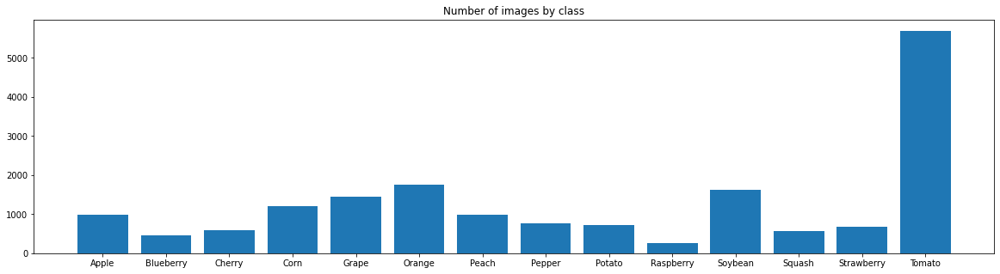


Images per class:



{'Apple': 988,
 'Blueberry': 467,
 'Cherry': 583,
 'Corn': 1206,
 'Grape': 1458,
 'Orange': 1748,
 'Peach': 977,
 'Pepper': 765,
 'Potato': 716,
 'Raspberry': 264,
 'Soybean': 1616,
 'Squash': 574,
 'Strawberry': 673,
 'Tomato': 5693}

In [ ]:
#Compute and show the size of each training class 
classes_size_dictionary = {}

for i in range(len(labels)):
  classes_size_dictionary[labels[i]] = len(next(os.walk('{}/{}/'.format(dataset_dir, labels[i])))[2])

plt.figure(figsize=(20,5))
plt.bar(classes_size_dictionary.keys(), classes_size_dictionary.values(), )
plt.title("Number of images by class")
plt.show()

print('\nImages per class:\n')
classes_size_dictionary

In [ ]:
# Utility function
def get_dims(file):
  '''Returns dimensions for an RBG image'''
  im = Image.open(file)
  arr = np.array(im)
  h,w = arr.shape[:2]
  return h,w

In [ ]:
#Finding size outliers
print("Expected size: (256,256)")

for i in range(len(labels)):
  if i < len(labels):
    class_imgs = next(os.walk('{}/{}/'.format(dataset_dir, labels[i])))[2]
    for x in range(len(class_imgs)):
       img = '{}/{}/{}'.format(dataset_dir, labels[i], class_imgs[x])
       if(get_dims(img)!=(256,256)): print("Element {} has size: {}".format(img,get_dims(img)))

Expected size: (256,256)
Element training/Peach/32004.jpg has size: (512, 466)
Element training/Tomato/41285.jpg has size: (512, 335)


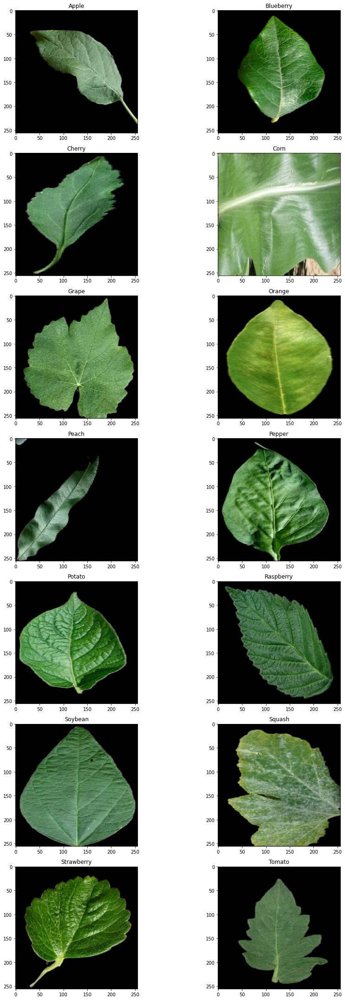

In [ ]:
# Plot one example image per class from dataset

num_row = len(labels)//2
num_col = len(labels)//num_row
fig, axes = plt.subplots(num_row, num_col, figsize=(2*num_row,15*num_col))
for i in range(len(labels)):
  if i < len(labels):
    class_imgs = next(os.walk('{}/{}/'.format(dataset_dir, labels[i])))[2]
    class_img = class_imgs[0]
    img = Image.open('{}/{}/{}'.format(dataset_dir, labels[i], class_img))
    ax = axes[i//num_col, i%num_col]
    ax.imshow(np.array(img))
    ax.set_title('{}'.format(labels[i]))
plt.tight_layout()
plt.show()

In [ ]:
# Plot n random example images per class from dataset

def plot_rand_n(n):
  if(n<2): n=2
  num_row = len(labels)
  num_col = n
  fig, axes = plt.subplots(num_row, num_col, figsize=(2*num_row,15*num_col))
  for i in range(len(labels)):
    if i < len(labels):
      class_imgs = next(os.walk('{}/{}/'.format(dataset_dir, labels[i])))[2]
      class_img = np.random.choice(class_imgs, n, replace = False)
      for x in range(len(class_img)):
        img = Image.open('{}/{}/{}'.format(dataset_dir, labels[i], class_img[x]))
        ax = axes[i, x]
        ax.imshow(np.array(img))
        ax.set_title('{}'.format(labels[i]))
  plt.tight_layout()
  plt.show()

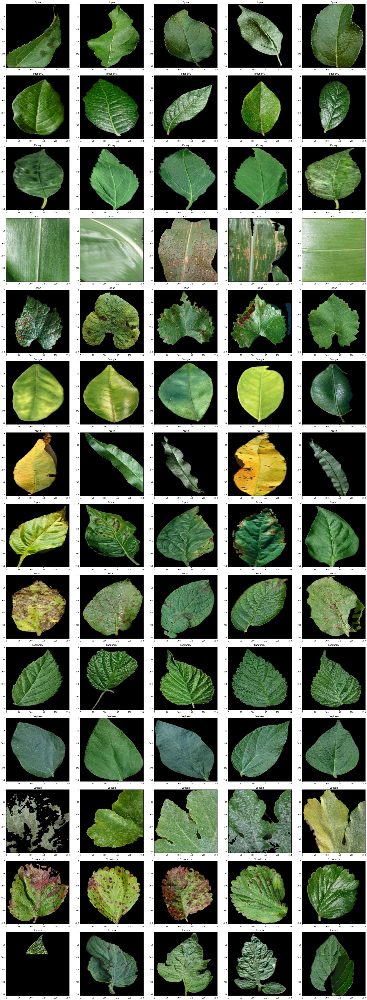

In [ ]:
#Plot 5 random images per class
plot_rand_n(5)

In [ ]:
# Using ImageDataGenerator for data loading
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_data_gen = ImageDataGenerator()
train_gen = train_data_gen.flow_from_directory(directory=dataset_dir,
                                               target_size=(256,256),
                                               color_mode='rgb',
                                               classes=None, 
                                               class_mode='categorical', # categorical labels
                                               batch_size=8,
                                               shuffle=True,
                                               seed=seed)

Found 17728 images belonging to 14 classes.


In [ ]:
# Inspecting labels
print("Assigned labels")
print(train_gen.class_indices)
print()
print("Target classes")
print(train_gen.classes)

Assigned labels
{'Apple': 0, 'Blueberry': 1, 'Cherry': 2, 'Corn': 3, 'Grape': 4, 'Orange': 5, 'Peach': 6, 'Pepper': 7, 'Potato': 8, 'Raspberry': 9, 'Soybean': 10, 'Squash': 11, 'Strawberry': 12, 'Tomato': 13}

Target classes
[ 0  0  0 ... 13 13 13]


In [ ]:
def get_next_batch(generator):
  batch = next(generator)

  image = batch[0] 
  target = batch[1] 

  print("(Input) image shape:", image.shape)
  print("Target shape:",target.shape)

  # Visualize only the first sample
  image = image[0] 
  target = target[0]
  target_idx = np.argmax(target)
  print()
  print("Categorical label:", target)
  print("Label:", target_idx)
  print("Class name:", labels[target_idx])
  fig = plt.figure(figsize=(6, 4))
  plt.imshow(np.uint8(image))

  return batch

(Input) image shape: (8, 256, 256, 3)
Target shape: (8, 14)

Categorical label: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
Label: 13
Class name: Tomato


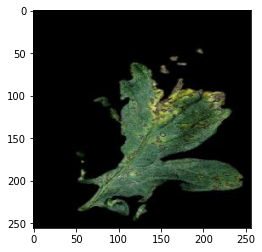

In [ ]:
# Get a sample from dataset and show info
_ = get_next_batch(train_gen)

Rotation: {'theta': -7.527592869158251, 'tx': 0, 'ty': 0, 'shear': 0, 'zx': 1, 'zy': 1, 'flip_horizontal': 0, 'flip_vertical': 0, 'channel_shift_intensity': None, 'brightness': None} 

Shift: {'theta': 0, 'tx': 0, 'ty': 38, 'shear': 0, 'zx': 1, 'zy': 1, 'flip_horizontal': 0, 'flip_vertical': 0, 'channel_shift_intensity': None, 'brightness': None} 

Zoom: {'theta': 0, 'tx': 0, 'ty': 0, 'shear': 0, 'zx': 0.9247240713084175, 'zy': 1.2704285838459497, 'flip_horizontal': 0, 'flip_vertical': 0, 'channel_shift_intensity': None, 'brightness': None} 

Flip: {'theta': 0, 'tx': 0, 'ty': 0, 'shear': 0, 'zx': 1, 'zy': 1, 'flip_horizontal': 1, 'flip_vertical': 0, 'channel_shift_intensity': None, 'brightness': None} 



Text(0.5, 1.0, 'Flipped')

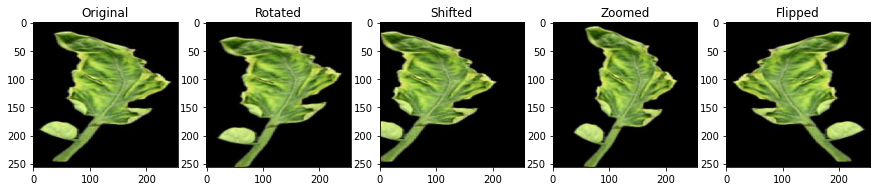

In [ ]:
# Create some augmentation examples

# Get sample image
image = next(train_gen)[0][4] 

# Create an instance of ImageDataGenerator for each transformation
rot_gen = ImageDataGenerator(rotation_range=30)  
shift_gen = ImageDataGenerator(width_shift_range=50) 
zoom_gen = ImageDataGenerator(zoom_range=0.3)
flip_gen = ImageDataGenerator(horizontal_flip=True)

# Get random transformations
rot_t = rot_gen.get_random_transform(img_shape=(256, 256), seed=seed)
print('Rotation:', rot_t, '\n')
shift_t = shift_gen.get_random_transform(img_shape=(256, 256), seed=seed)
print('Shift:', shift_t, '\n')
zoom_t = zoom_gen.get_random_transform(img_shape=(256, 256), seed=seed)
print('Zoom:', zoom_t, '\n')
flip_t = flip_gen.get_random_transform(img_shape=(256, 256), seed=seed)
print('Flip:', flip_t, '\n')

# Apply the transformation
gen = ImageDataGenerator(fill_mode='constant', cval=0.) # fill with black pixels
rotated = gen.apply_transform(image, rot_t)
shifted = gen.apply_transform(image, shift_t) 
zoomed = gen.apply_transform(image, zoom_t) 
flipped = gen.apply_transform(image, flip_t)  

# Plot original and augmented images
fig, ax = plt.subplots(1, 5, figsize=(15, 45))
ax[0].imshow(np.uint8(image))
ax[0].set_title('Original')
ax[1].imshow(np.uint8(rotated))
ax[1].set_title('Rotated')
ax[2].imshow(np.uint8(shifted))
ax[2].set_title('Shifted')
ax[3].imshow(np.uint8(zoomed))
ax[3].set_title('Zoomed')
ax[4].imshow(np.uint8(flipped))
ax[4].set_title('Flipped')

Transform: {'theta': -45.1655572149495, 'tx': -92, 'ty': -71, 'shear': 0, 'zx': 1.0968501579464869, 'zy': 0.9458327528535911, 'flip_horizontal': 1, 'flip_vertical': 1, 'channel_shift_intensity': None, 'brightness': None}


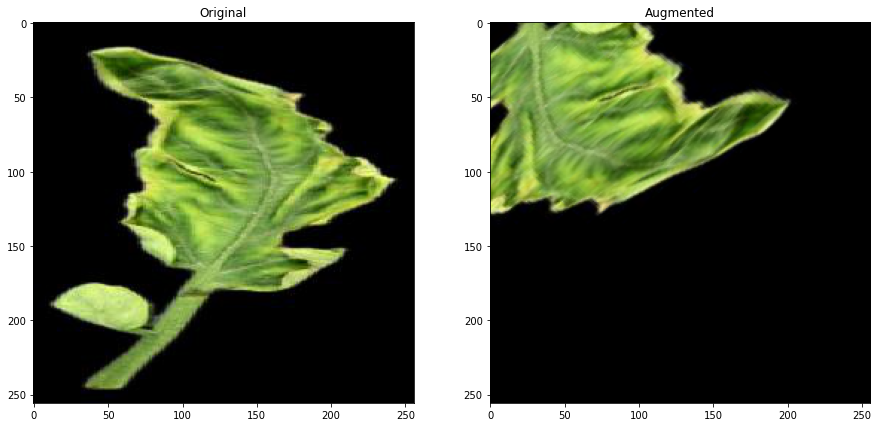

In [ ]:
# Combine multiple transformations
gen = ImageDataGenerator(rotation_range=180,
                         height_shift_range=100,
                         width_shift_range=100,
                         zoom_range=0.5,
                         horizontal_flip=True,
                         vertical_flip=True,
                         fill_mode='constant')

# Get random transformation
t = gen.get_random_transform(img_shape=(256, 256), seed=seed)
print("Transform:", t)

# Apply the transformation
augmented = gen.apply_transform(image, t)

# Plot original and augmented images
fig, ax = plt.subplots(1, 2, figsize=(15,30))
ax[0].imshow(np.uint8(image))
ax[0].set_title("Original")
ax[1].imshow(np.uint8(augmented))
ax[1].set_title("Augmented")
plt.show()